In [1]:
import numpy as np
import matplotlib.pyplot as plt
from pyuvdata import UVData
from pyuvdata import uvutils
from hera_qm import ant_metrics
import hera_cal
from copy import deepcopy
from scipy.signal import medfilt2d

from matplotlib.colors import SymLogNorm
import sys
import os
from hera_qm import xrfi as xrfi
import numpy.ma as ma
from glob import glob
import math

In [2]:

data_file_list = ['/data6/HERA/data/2458042/zen.2458042.12552.xx.HH.uv','/data6/HERA/data/2458042/zen.2458042.12552.yy.HH.uv','/data6/HERA/data/2458042/zen.2458042.12552.yx.HH.uv','/data6/HERA/data/2458042/zen.2458042.12552.xy.HH.uv']

uv = UVData()

uv.read_miriad(data_file_list)


Combined polarizations are not evenly spaced. This will make it impossible to write this data out to some file types.


In [3]:

aa = hera_cal.utils.get_aa_from_uv(uv)

info = hera_cal.omni.aa_to_info(aa)

reds = info.get_reds()


In [144]:

am = ant_metrics.Antenna_Metrics(data_file_list, reds, fileformat = 'miriad')


In [4]:

bases = []

lst = uv.get_antpairpols()

for i in range(uv.Nbls):
    
    pair = lst[4*i]
    
    bases.append((pair[0],pair[1]))
    
print bases


[(0, 0), (0, 1), (0, 2), (0, 11), (0, 12), (0, 13), (0, 14), (0, 23), (0, 24), (0, 25), (0, 26), (0, 27), (0, 36), (0, 37), (0, 38), (0, 39), (0, 40), (0, 41), (0, 50), (0, 51), (0, 52), (0, 53), (0, 54), (0, 55), (0, 65), (0, 66), (0, 67), (0, 68), (0, 69), (0, 70), (0, 71), (0, 82), (0, 83), (0, 84), (0, 85), (0, 86), (0, 87), (0, 88), (0, 98), (0, 120), (0, 121), (0, 122), (0, 123), (0, 124), (0, 141), (0, 142), (0, 143), (1, 1), (1, 2), (1, 11), (1, 12), (1, 13), (1, 14), (1, 23), (1, 24), (1, 25), (1, 26), (1, 27), (1, 36), (1, 37), (1, 38), (1, 39), (1, 40), (1, 41), (1, 50), (1, 51), (1, 52), (1, 53), (1, 54), (1, 55), (1, 65), (1, 66), (1, 67), (1, 68), (1, 69), (1, 70), (1, 71), (1, 82), (1, 83), (1, 84), (1, 85), (1, 86), (1, 87), (1, 88), (1, 98), (1, 120), (1, 121), (1, 122), (1, 123), (1, 124), (1, 141), (1, 142), (1, 143), (2, 2), (2, 11), (2, 12), (2, 13), (2, 14), (2, 23), (2, 24), (2, 25), (2, 26), (2, 27), (2, 36), (2, 37), (2, 38), (2, 39), (2, 40), (2, 41), (2, 50),

In [5]:

nonreds = []

for i in bases:
    
    flag = 0
    
    for j in reds:
        
        for k in j:
            
            if i == k:
                
                flag = 1
                
    if flag == 0:
        
        nonreds.append(i)
        
    
print nonreds


[(0, 0), (0, 98), (0, 143), (1, 1), (1, 98), (2, 2), (2, 98), (2, 120), (2, 141), (11, 11), (12, 12), (13, 13), (13, 98), (14, 14), (14, 98), (14, 120), (23, 23), (24, 24), (25, 25), (26, 26), (26, 98), (27, 27), (27, 98), (36, 36), (37, 37), (38, 38), (39, 39), (40, 40), (40, 98), (41, 41), (41, 98), (50, 50), (51, 51), (52, 52), (53, 53), (54, 54), (55, 55), (55, 98), (65, 65), (65, 124), (66, 66), (67, 67), (68, 68), (69, 69), (70, 70), (71, 71), (71, 98), (82, 82), (83, 83), (84, 84), (85, 85), (86, 86), (87, 87), (87, 98), (88, 88), (88, 98), (98, 98), (98, 124), (98, 143), (120, 120), (121, 121), (122, 122), (123, 123), (124, 124), (141, 141), (142, 142), (143, 143)]


In [6]:
v = deepcopy (uv)


In [7]:

def signal(amp,width,baseline):
    
    ant_1 = baseline[0]
    
    ant_2 = baseline[1]
    
    if (ant_1 == ant_2):
        
        return np.zeros((60,1024,4))
    
    ant_1_ind = np.where(uv.antenna_numbers==ant_1)
    
    ant_2_ind = np.where(uv.antenna_numbers==ant_2)
    
    dist = np.linalg.norm(uv.antenna_positions[ant_1_ind]-uv.antenna_positions[ant_2_ind])
    
    c = float(3e8)
    
    B = float(uv.freq_array[0][-1]-uv.freq_array[0][1])
    
    del_tau = 1. / B
    
    tau = (c * del_tau) / (dist * np.cos(15*np.pi / 180))
    
    temp = np.zeros((60,1024,4),dtype = complex)
    
    T = uv.Ntimes*10
    
    del_nu = 1. / T
    
    earth_rot = 1. / 86164.09053
    
    freq_naught = np.median(uv.freq_array[0])
    
    nu = earth_rot * dist * freq_naught / c
    
    temp = np.random.normal(amp,width,(60,1024,4)) * np.exp(nu_rang*(del_nu/nu)) * np.sinc(tau_rang*tau)
    
    result = np.zeros((60,1024,4),dtype = complex)
    
    result[:,:,0] = np.fft.fftn(temp[:,:,0])
    
    result[:,:,1] = np.fft.fftn(temp[:,:,1])
    
    result[:,:,2] = np.fft.fftn(temp[:,:,2])
    
    result[:,:,3] = np.fft.fftn(temp[:,:,3])
    
    return result
    

In [8]:

def noise(amp,width):
    
    real = np.random.normal(amp,width,(60,1024,4))
    
    imag = np.random.normal(amp,width,(60,1024,4))
    
    sig = np.array(real,dtype = complex)
    
    sig.imag = imag
    
    result = sig
    
    return result


In [9]:

nu_rang = np.zeros((60,1024,4))
    
tau_rang = np.zeros((60,1024,4))
    
for i in range(uv.Ntimes):
        
    nu_rang[i,:,:] = -i
        
for j in range(uv.Nfreqs/2 + 1):
        
    tau_rang[:,j,:] = j
    
    if (j != 0):
        
        tau_rang[:,-j,:] = j
    

In [10]:

new_data_array = np.zeros((67680, 1, 1024, 4),dtype = complex)

sig_data_array = np.zeros((67680, 1, 1024, 4),dtype = complex)

noi_data_array = np.zeros((67680, 1, 1024, 4),dtype = complex)

s_width = 1

s_amp = 0

i_width = 0.3

i_amp = 0

n_width = 0.5

n_amp = 0

xant = 23

x_width = 0.

x_amp = 0

for i in reds:
        
    sig = signal(s_amp,s_width,i[0])
    
    print 'working'
        
    for j in i:
        
        x_sig = 0
        
        i_sig = signal(i_amp,i_width,j)
        
        if ((j[0] == xant) or (j[1] == xant)):
            
            x_sig = signal(x_amp,x_width,j)
            
            norm_power = float(s_width**2)
            
            new_power = float(norm_power + i_width**2 + x_width**2)
            
            ratio = np.sqrt(norm_power/new_power)
            
            sigs = (sig + i_sig + x_sig) * ratio
            
        else:
            
            norm_power = float(s_width**2)
            
            new_power = float(norm_power + i_width**2)
            
            ratio = np.sqrt(norm_power/new_power)
            
            sigs = (sig + i_sig) * ratio
            
        indices = v.antpair2ind(j[0],j[1])
            
        noi = noise(n_amp,n_width)
        
        visibility = sigs + noi
            
        new_data_array[indices,0,:,:] = visibility
        
        sig_data_array[indices,0,:,:] = sig
        
        noi_data_array[indices,0,:,:] = noi
            

working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working


In [11]:

for i in nonreds:
    
    print 'working'
    
    sig = signal(s_amp,s_width,i)
    
    i_sig = signal(i_amp,i_width,i)
    
    indices = v.antpair2ind(i[0],i[1])
            
    noi = noise(n_amp,n_width)
    
    x_sig = 0
    
    if ((i[0] == xant) or (i[1] == xant)):
            
        x_sig = signal(x_amp,x_width,i)
            
        norm_power = float(s_width**2)
            
        new_power = float(norm_power + i_width**2 + x_width**2)
            
        ratio = np.sqrt(norm_power/new_power)
        
        sigs = (sig + i_sig + x_sig) * ratio
        
    else:
        
        norm_power = float(s_width**2)
            
        new_power = float(norm_power + i_width**2)
            
        ratio = np.sqrt(norm_power/new_power)        
        
        sigs = (sig + i_sig) * ratio
            
    visibility = sigs + noi
            
    new_data_array[indices,0,:,:] = visibility
    
    sig_data_array[indices,0,:,:] = sig
        
    noi_data_array[indices,0,:,:] = noi
    

working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working
working


In [12]:

print new_data_array


[[[[ 0.13718925-0.31832638j  0.59827261-0.00814427j -0.31181570+0.65450741j
     0.32891572+0.24046395j]
   [-0.17015383+0.41883113j  0.54294983-1.01031435j  0.14178204+0.23594245j
     1.02979334-0.03255901j]
   [-0.58550806-0.71894669j -0.49599336-0.18615074j -0.34847301-0.08619293j
     0.34314850-0.27043256j]
   ..., 
   [-0.61651849+0.17985076j -0.03926362+0.22764185j -0.03890674-0.26233622j
    -0.86486927+0.03342372j]
   [ 0.62890547+0.11804632j -0.18485805-0.1631679j   0.13002383+0.12557179j
     0.40456821+0.00178162j]
   [-0.21916923-0.17699131j  1.05827975-0.65830891j -0.07391343-0.9332511j
    -0.48842440+0.73444883j]]]


 [[[ 1.07871765-0.64049696j  2.74875130-0.47255244j -0.69182238-0.02782356j
    -1.03096080-0.57873551j]
   [ 1.41190516-0.12825053j  3.08860053+0.35113356j -1.01389385-0.71658691j
    -1.19173082+0.3883349j ]
   [ 1.28784001+0.00534466j  2.55803276+0.28586276j -0.45539156+0.08654363j
    -1.47437848+0.5618387j ]
   ..., 
   [ 1.04511761-0.27466611j  2.295

In [13]:
v.data_array = new_data_array

<IPython.core.display.Javascript object>


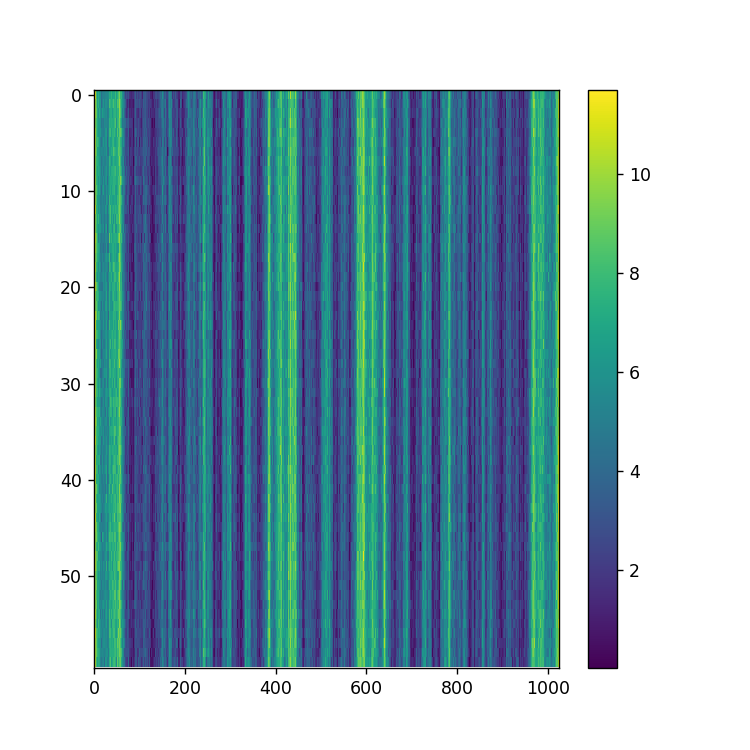

<IPython.core.display.Javascript object>


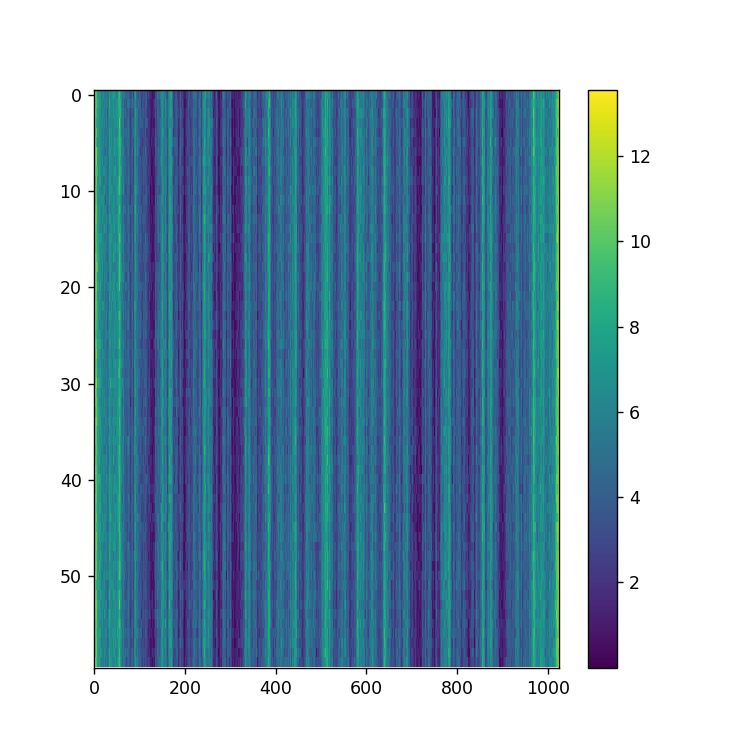

In [122]:

data = v.get_data(23,71,'xx')

plt.figure(figsize=(6,6))
#plt.imshow(np.angle(data), aspect='auto', norm=SymLogNorm(vmin=0,vmax=1,linthresh=.1))
plt.imshow(np.abs(data), aspect='auto')
plt.colorbar()
plt.show()



data = v.get_data(36,87,'xx')

plt.figure(figsize=(6,6))
#plt.imshow(np.angle(data), aspect='auto', norm=SymLogNorm(vmin=0,vmax=1,linthresh=.1))
plt.imshow(np.abs(data), aspect='auto')
plt.colorbar()
plt.show()

<IPython.core.display.Javascript object>


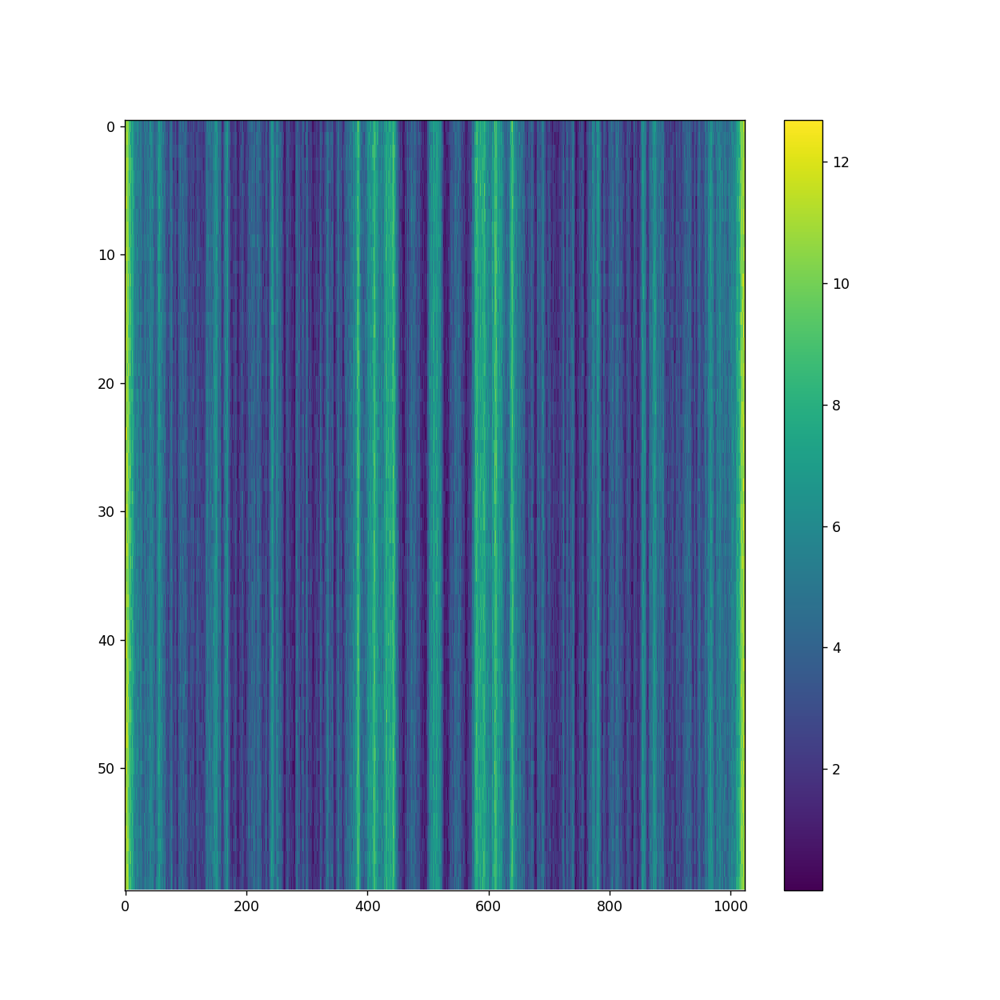

In [125]:

data = v.get_data(37,88,'xx')

plt.figure(figsize=(10,10))
#plt.imshow(np.angle(data), aspect='auto', norm=SymLogNorm(vmin=0,vmax=1,linthresh=.1))
plt.imshow(np.abs(data), aspect='auto')
plt.colorbar()
plt.show()


<IPython.core.display.Javascript object>


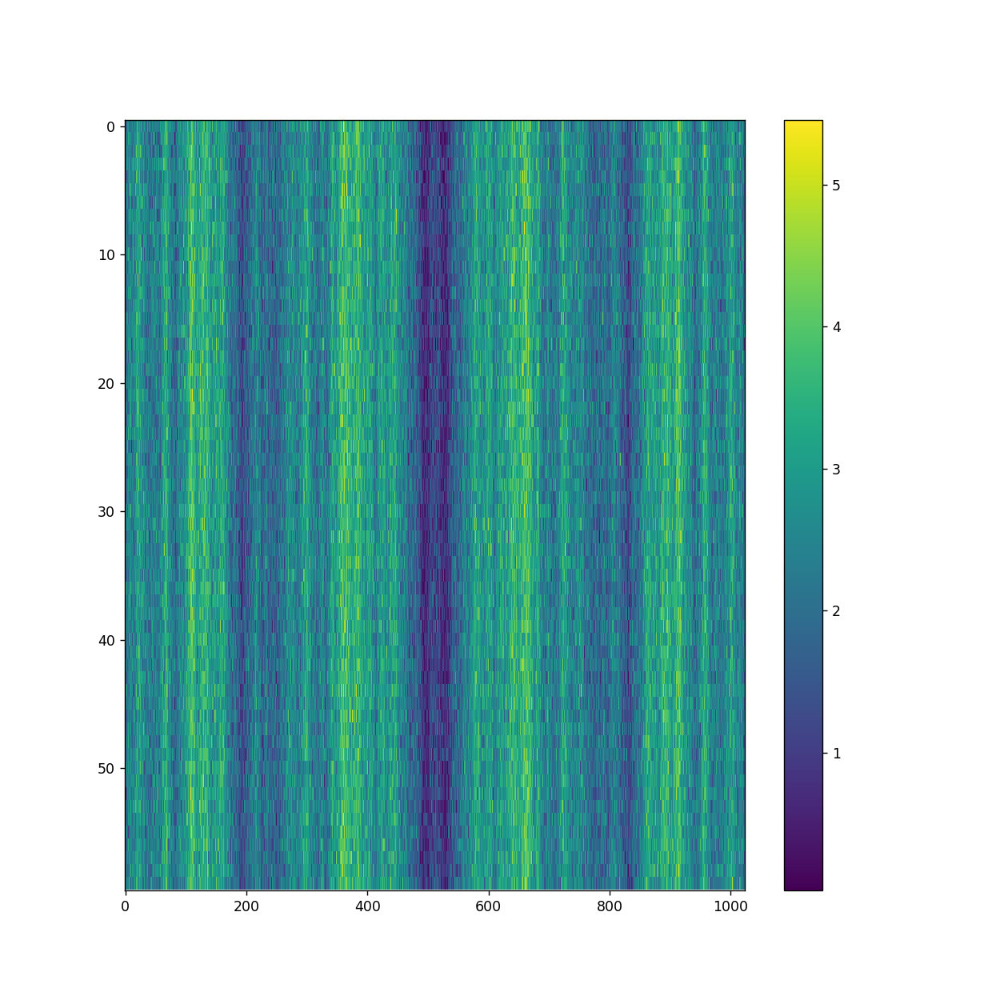

In [123]:

data = v.get_data(0,1,'xx')

plt.figure(figsize=(10,10))
#plt.imshow(np.angle(data), aspect='auto', norm=SymLogNorm(vmin=0,vmax=1,linthresh=.1))
plt.imshow(np.abs(data), aspect='auto')
plt.colorbar()
plt.show()


<IPython.core.display.Javascript object>


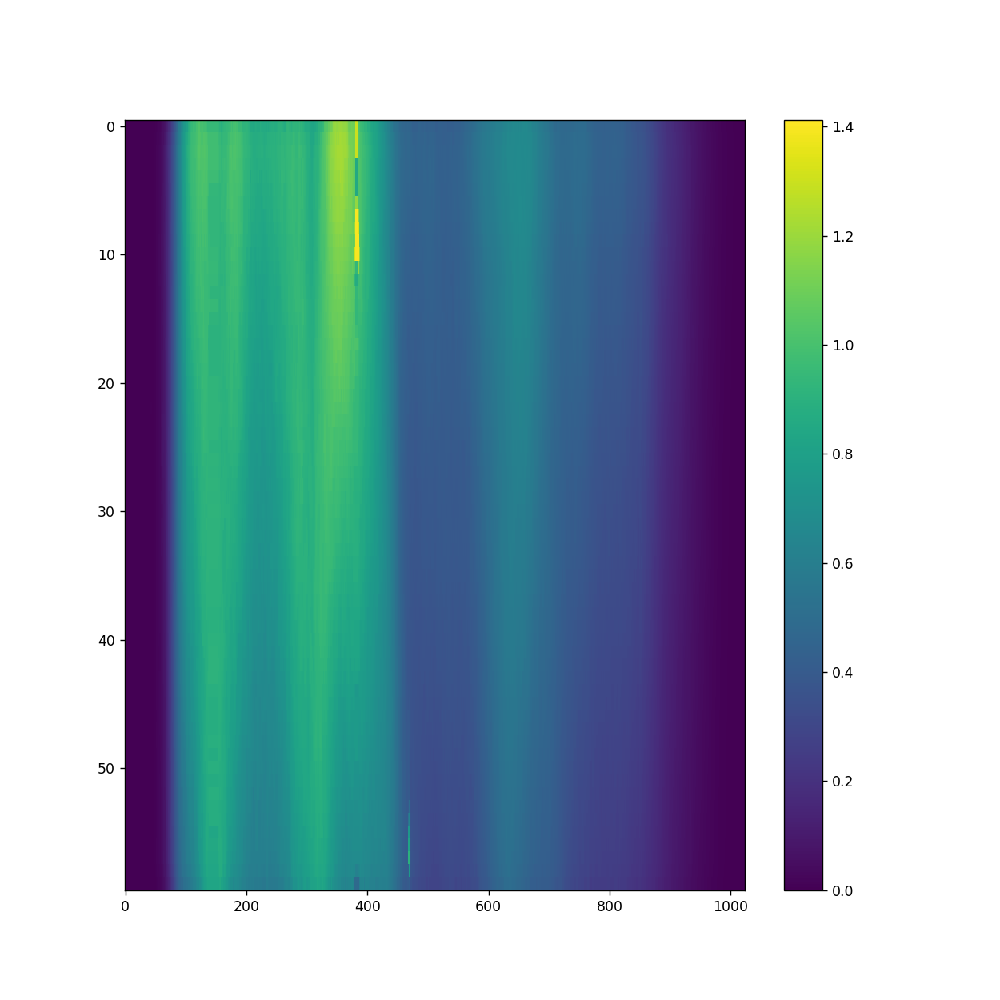

In [126]:

data = v_mod.get_data(0,13,'xx')

foo = medfilt2d(np.abs(data),(5,5))

plt.figure(figsize=(10,10))
#plt.imshow(np.abs(data), aspect='auto', norm=SymLogNorm(vmin=0,vmax=40,linthresh=.1))
plt.imshow(foo, aspect='auto')
#plt.imshow(np.abs(data), aspect='auto')
plt.colorbar()
plt.show()


<IPython.core.display.Javascript object>


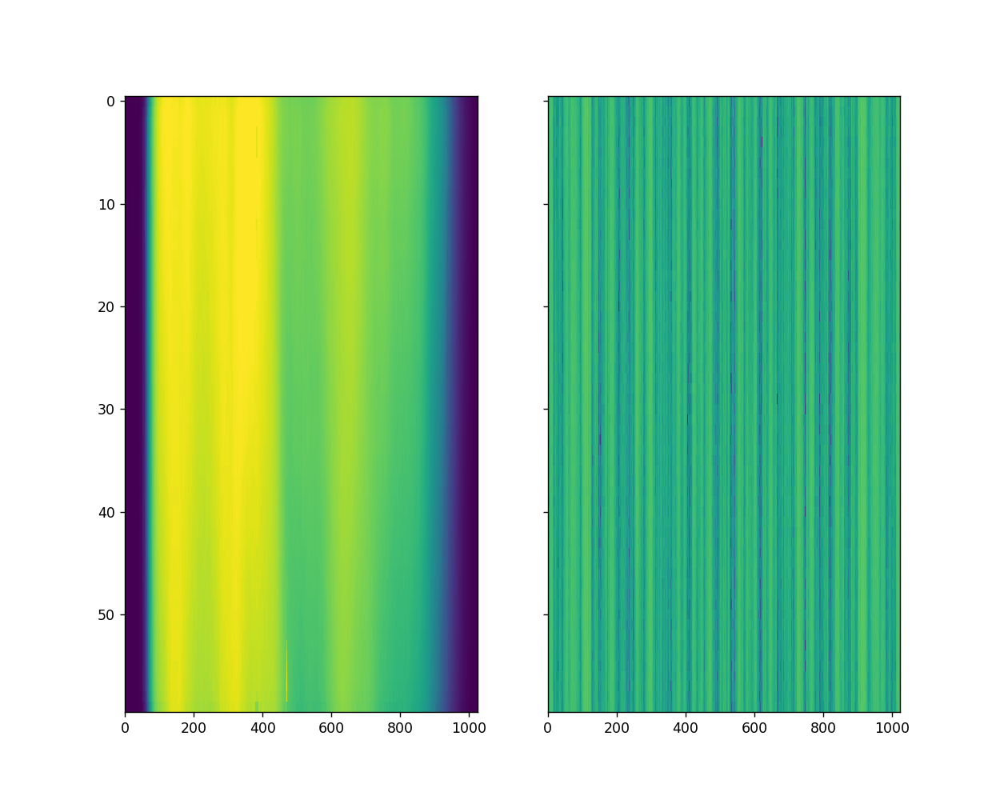

In [124]:
ant_1 = 0
ant_2 = 143

f, (ax1, ax2) = plt.subplots(1, 2, sharey=True,figsize =(10,8))
data_sim = v.get_data(ant_1,ant_2,'xx')
data_real = v_mod.get_data(ant_1,ant_2,'xx')

ax1.imshow(np.abs(foo), aspect='auto', norm=SymLogNorm(vmin=0,vmax=1,linthresh=.1))
#ax1.imshow(np.abs(np.fft.fftn(data_real)), aspect='auto')
#ax2.imshow(np.abs(np.fft.fftn(data_sim)), aspect='auto')
ax2.imshow(np.abs(data_sim), aspect='auto', norm=SymLogNorm(vmin=0,vmax=150,linthresh=.1))
plt.show()


In [127]:
am.data.data_array = new_data_array

In [145]:
am.xants = []

In [146]:
rawRed = ant_metrics.red_corr_metrics(v,['xx','yy','xy','yx'],['x','y'],uv.antenna_numbers,reds,am.xants,rawMetric = True)

In [147]:
z_scores = ant_metrics.per_antenna_modified_z_scores(rawRed)

In [148]:

values = []

values_raw = []

for key in z_scores.keys():
    
    values.append(z_scores[key]) 
    
    values_raw.append(rawRed[key])


<IPython.core.display.Javascript object>


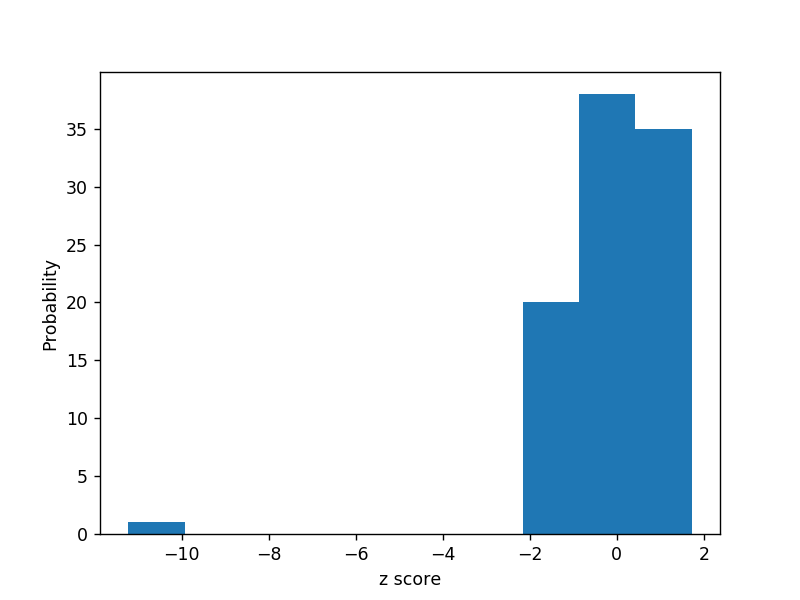

<IPython.core.display.Javascript object>


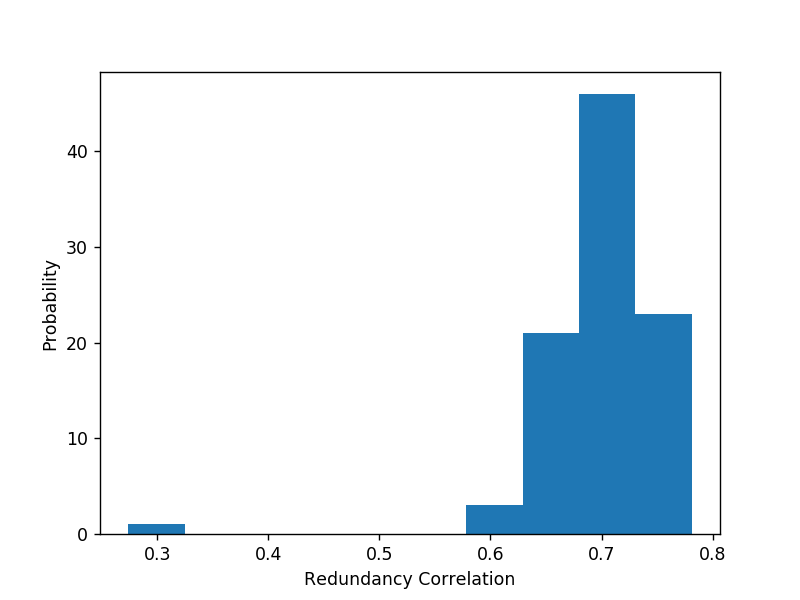

In [149]:
plt.figure()
plt.hist(values)
plt.xlabel('z score')
plt.ylabel('Probability')
#plt.xlim(-2,2)
plt.show()

plt.figure()
plt.hist(values_raw)
plt.xlabel('Redundancy Correlation')
plt.ylabel('Probability')
plt.show()

In [150]:

am.iterative_antenna_metrics_and_flagging(crossCut = 5,deadCut = 5)

print am.xants


[(50, 'x')]


In [151]:

def plot_metric(metrics, ants=None, antpols=None, title='', ylabel='Modified z-Score', xlabel=''):
    
    if ants is None:
        
        ants = list(set([key[0] for key in metrics.keys()]))
        
    if antpols is None:
        
        antpols = list(set([key[1] for key in metrics.keys()]))
        
    for antpol in antpols:
        
        for i,ant in enumerate(ants):
            
            metric = 0
            
            if metrics.has_key((ant,antpol)):
                
                metric = metrics[(ant,antpol)]
                
            plt.plot(i,metric,'.')
            
            plt.annotate(str(ant) + antpol, xy = (i,metrics[(ant,antpol)]))
            
        plt.gca().set_prop_cycle(None)
        
    plt.title(title)
    
    plt.xlabel(xlabel)
    
    plt.ylabel(ylabel)
    
    plt.show()
        

<IPython.core.display.Javascript object>


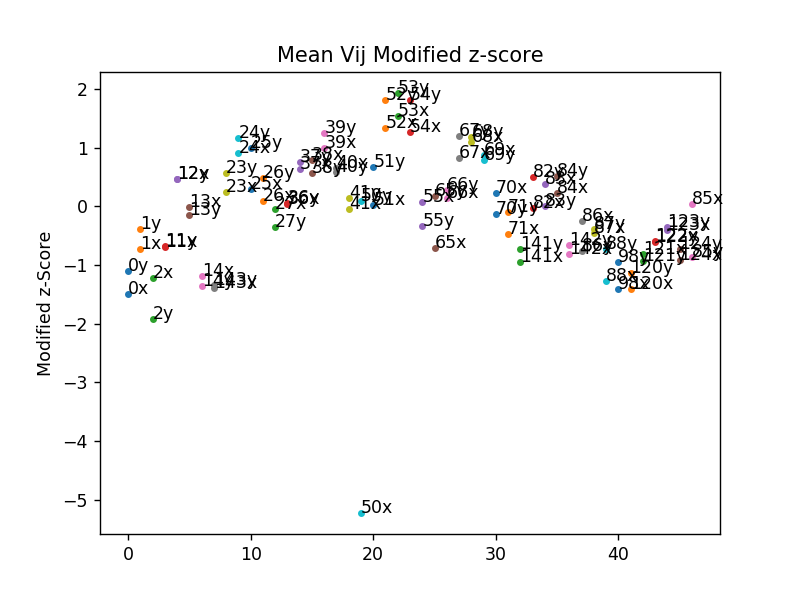

<IPython.core.display.Javascript object>


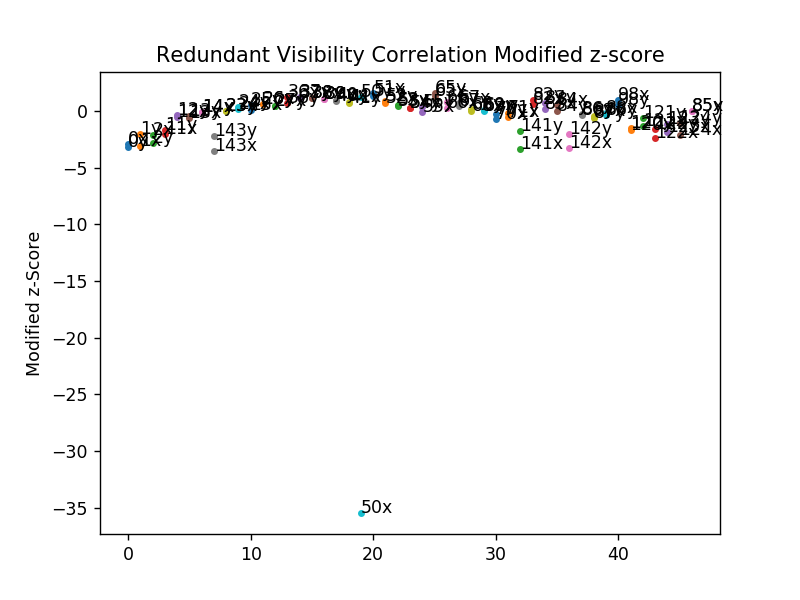

<IPython.core.display.Javascript object>


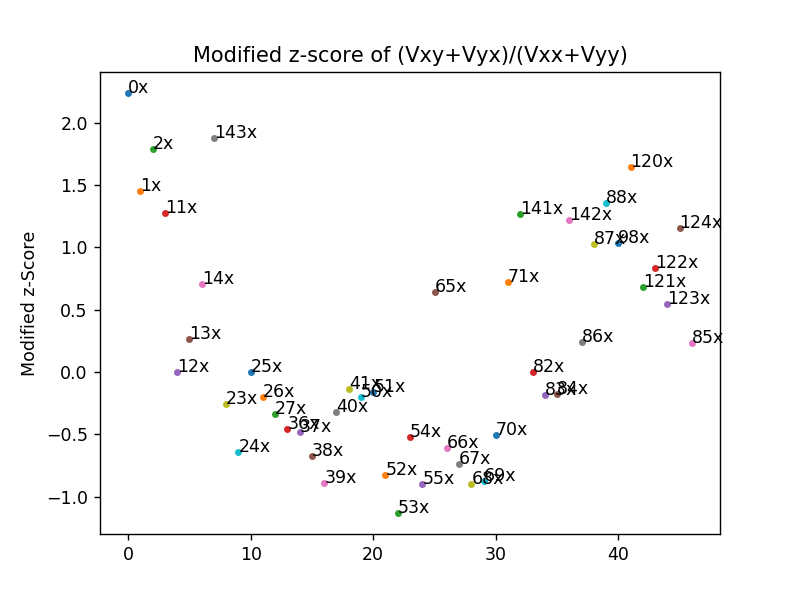

<IPython.core.display.Javascript object>


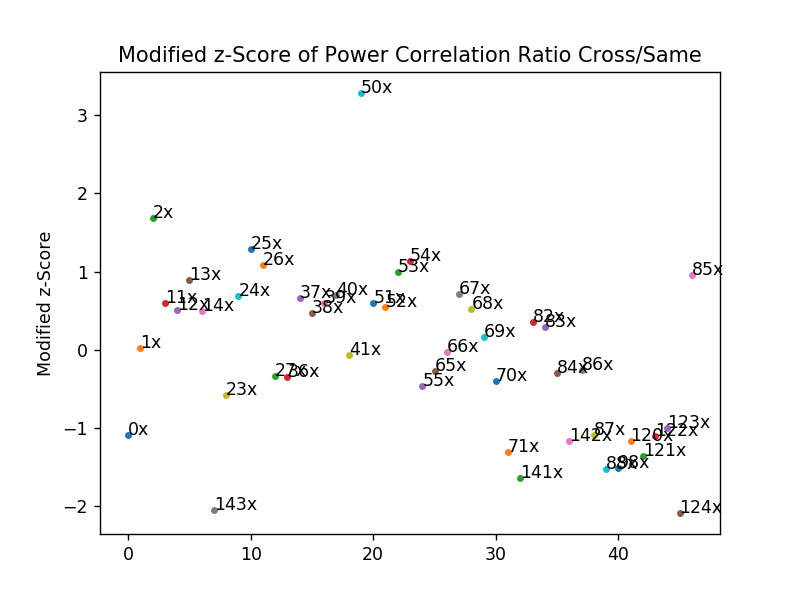

In [152]:

plt.figure()

plot_metric(am.finalModzScores['meanVij'],title='Mean Vij Modified z-score')

plt.figure()

plot_metric(am.finalModzScores['redCorr'],title = 'Redundant Visibility Correlation Modified z-score')

plt.figure()

plot_metric(am.finalModzScores['meanVijXPol'],antpols = ['x'], title = 'Modified z-score of (Vxy+Vyx)/(Vxx+Vyy)')

plt.figure()

plot_metric(am.finalModzScores['redCorrXPol'], antpols = ['x'], title = 'Modified z-Score of Power Correlation Ratio Cross/Same')


In [153]:
rawRed = ant_metrics.red_corr_metrics(v,['xx','yy','xy','yx'],['x','y'],uv.antenna_numbers,reds,am.xants,rawMetric = True)

In [154]:
z_scores = ant_metrics.per_antenna_modified_z_scores(rawRed)

In [155]:

values = []

values_raw = []

for key in z_scores.keys():
    
    values.append(z_scores[key]) 
    
    values_raw.append(rawRed[key])


<IPython.core.display.Javascript object>


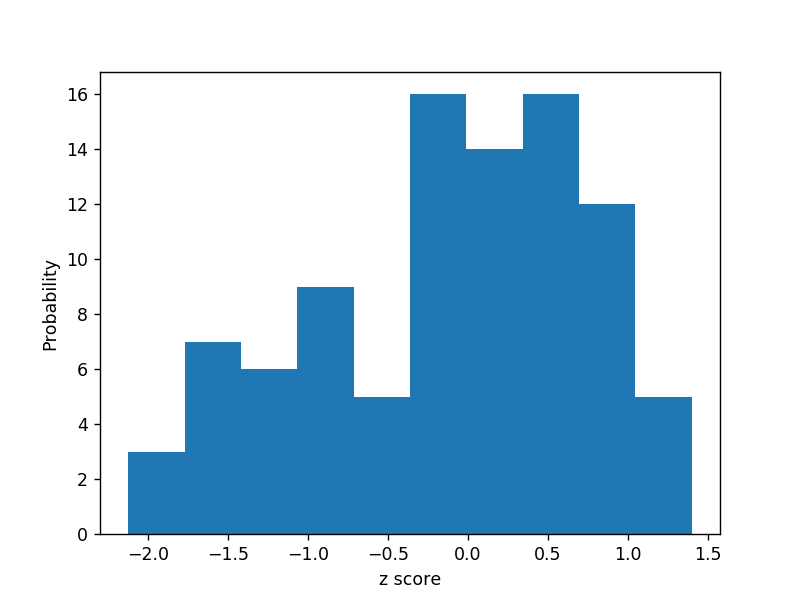

<IPython.core.display.Javascript object>


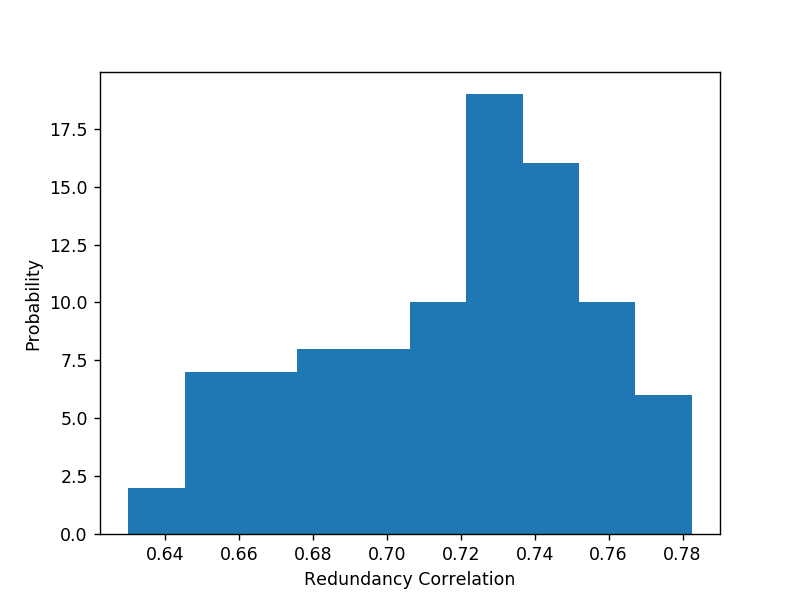

In [156]:
plt.figure()
plt.hist(values)
plt.xlabel('z score')
plt.ylabel('Probability')
#plt.xlim(-2,2)
plt.show()

plt.figure()
plt.hist(values_raw)
plt.xlabel('Redundancy Correlation')
plt.ylabel('Probability')
plt.show()

In [158]:
print np.mean(values)
print np.mean(values_raw)

-0.10997475486
0.717098097418


## Manually Removing the RFI

In [20]:
print np.where(uv.data_array[0,0,:,0] >= 40)

(array([  61,   62,  109,  110,  111,  112,  113,  114,  115,  116,  117,
        118,  119,  120,  121,  122,  123,  124,  125,  126,  127,  128,
        129,  130,  131,  132,  133,  134,  135,  136,  137,  138,  139,
        140,  141,  142,  143,  144,  145,  146,  147,  148,  149,  150,
        151,  152,  153,  154,  155,  156,  157,  158,  159,  160,  161,
        162,  163,  164,  165,  166,  167,  168,  169,  170,  171,  172,
        173,  174,  175,  176,  177,  178,  179,  180,  181,  182,  183,
        184,  185,  186,  187,  188,  189,  190,  191,  192,  193,  194,
        195,  196,  197,  198,  199,  200,  201,  202,  203,  204,  205,
        206,  207,  208,  209,  210,  211,  212,  213,  214,  215,  216,
        217,  218,  219,  220,  221,  222,  223,  224,  225,  226,  227,
        228,  229,  230,  231,  232,  233,  234,  235,  236,  237,  238,
        239,  240,  241,  242,  243,  244,  245,  246,  247,  248,  249,
        250,  251,  252,  253,  254,  255,  256,  

In [21]:
v_mod = deepcopy(uv)

In [22]:
test = v_mod.data_array

In [23]:

for i in range(uv.data_array.shape[0]):
    
    for j in range(uv.data_array.shape[3]):
        
        test[i,0,62,j] = (test[i,0,60,j]+test[i,0,63,j])/2.
        test[i,0,61,j] = (test[i,0,60,j]+test[i,0,63,j])/2.

        test[i,0,379,j] = (test[i,0,386,j]+test[i,0,378,j])/2.
        test[i,0,380,j] = (test[i,0,386,j]+test[i,0,378,j])/2.
        test[i,0,381,j] = (test[i,0,386,j]+test[i,0,378,j])/2.
        test[i,0,382,j] = (test[i,0,386,j]+test[i,0,378,j])/2.
        test[i,0,383,j] = (test[i,0,386,j]+test[i,0,378,j])/2.
        test[i,0,384,j] = (test[i,0,386,j]+test[i,0,378,j])/2.
        test[i,0,385,j] = (test[i,0,386,j]+test[i,0,378,j])/2.
        
        test[i,0,138,j] = (test[i,0,137,j]+test[i,0,155,j])/2.
        test[i,0,139,j] = (test[i,0,137,j]+test[i,0,155,j])/2.
        test[i,0,140,j] = (test[i,0,137,j]+test[i,0,155,j])/2.
        test[i,0,141,j] = (test[i,0,137,j]+test[i,0,155,j])/2.
        test[i,0,142,j] = (test[i,0,137,j]+test[i,0,155,j])/2.
        test[i,0,143,j] = (test[i,0,137,j]+test[i,0,155,j])/2.
        test[i,0,144,j] = (test[i,0,137,j]+test[i,0,155,j])/2.
        test[i,0,145,j] = (test[i,0,137,j]+test[i,0,155,j])/2.
        test[i,0,146,j] = (test[i,0,137,j]+test[i,0,155,j])/2.
        test[i,0,147,j] = (test[i,0,137,j]+test[i,0,155,j])/2.
        test[i,0,148,j] = (test[i,0,137,j]+test[i,0,155,j])/2.
        test[i,0,149,j] = (test[i,0,137,j]+test[i,0,155,j])/2.
        test[i,0,150,j] = (test[i,0,137,j]+test[i,0,155,j])/2.
        test[i,0,151,j] = (test[i,0,137,j]+test[i,0,155,j])/2.
        test[i,0,152,j] = (test[i,0,137,j]+test[i,0,155,j])/2.
        test[i,0,153,j] = (test[i,0,137,j]+test[i,0,155,j])/2.
        test[i,0,154,j] = (test[i,0,137,j]+test[i,0,155,j])/2.
        
        test[i,0,1023,j] = test[i,0,1022,j]


# Examining the Time Dependency of Features in the Real Data

In [ ]:

UV = UVData()

folders3=glob('../../data/2458042/zen.*.xx.HH.uv')
folders3.sort()
print(folders3)


In [ ]:

ant1,ant2 = 0,120

ant3,ant4 = 0,24

ant5,ant6 = 65,66

ant7,ant8 = 65,71


In [ ]:

first=True
full_array3=[]
#check the list
print(folders3)
print(len(folders3))

for folder in folders3:
    UV.read_miriad(folder, ant_pairs_nums=[(ant1,ant2)])
    print('Accessing ' + folder)
    temp_array3=UV.get_data((ant1,ant2,UV.polarization_array[0]))
    times=UV.get_times(ant1,ant2)
    UV.set_lsts_from_time_array()
    ind=UV.antpair2ind(ant1,ant2)
    temptime3=UV.lst_array[ind]
    if first==True:
        print('setting full for first time')
        full_array3=temp_array3
        timearr3=times
        first=False
    else:
        print('vstacking...')
        full_array3=np.vstack((full_array3, temp_array3))
        timearr3=np.hstack((timearr3,times))
    print(first)
    print('temp shape:')
    print(temp_array3.shape)
    print('Current shape:')
    print(full_array3.shape)
    print ('Time shape')
    print(timearr3.shape)

<IPython.core.display.Javascript object>


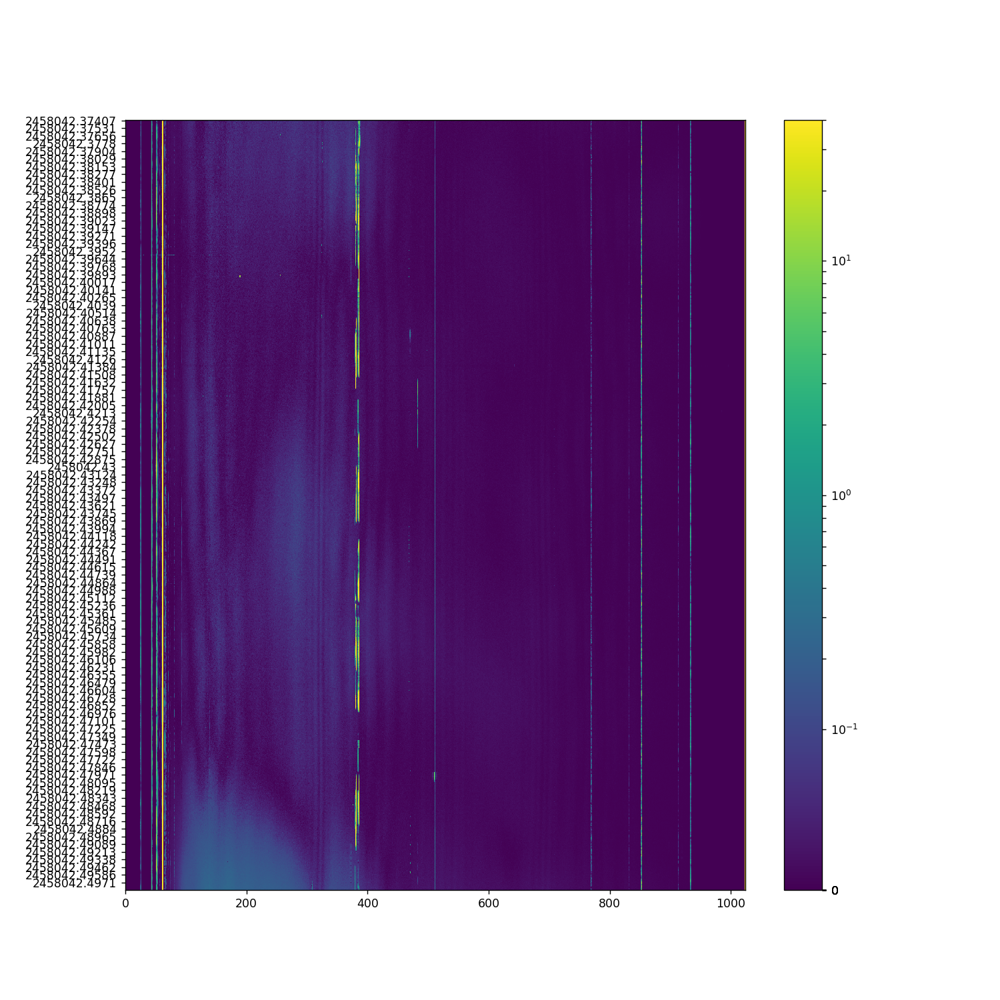

In [42]:
plt.figure(figsize=(12,12))
plt.imshow(np.abs(full_array3[2000:3000][:]),aspect='auto', norm=SymLogNorm(vmin=0,vmax=40,linthresh=.1))
plt.yticks(np.arange(0,1000,10),timearr3[2000:3000:10])
plt.colorbar()
plt.show()


In [45]:

first=True
full_array3=[]
#check the list
print(folders3)
print(len(folders3))

for folder in folders3:
    UV.read_miriad(folder, ant_pairs_nums=[(ant3,ant4)])
    print('Accessing ' + folder)
    temp_array3=UV.get_data((ant3,ant4,UV.polarization_array[0]))
    times=UV.get_times(ant3,ant4)
    UV.set_lsts_from_time_array()
    ind=UV.antpair2ind(ant3,ant4)
    temptime3=UV.lst_array[ind]
    if first==True:
        print('setting full for first time')
        full_array3=temp_array3
        timearr3=times
        first=False
    else:
        print('vstacking...')
        full_array3=np.vstack((full_array3, temp_array3))
        timearr3=np.hstack((timearr3,times))
    print(first)
    print('temp shape:')
    print(temp_array3.shape)
    print('Current shape:')
    print(full_array3.shape)
    print ('Time shape')
    print(timearr3.shape)

['../../data/2458042/zen.2458042.12552.xx.HH.uv', '../../data/2458042/zen.2458042.13298.xx.HH.uv', '../../data/2458042/zen.2458042.14043.xx.HH.uv', '../../data/2458042/zen.2458042.14789.xx.HH.uv', '../../data/2458042/zen.2458042.15535.xx.HH.uv', '../../data/2458042/zen.2458042.16280.xx.HH.uv', '../../data/2458042/zen.2458042.17026.xx.HH.uv', '../../data/2458042/zen.2458042.17772.xx.HH.uv', '../../data/2458042/zen.2458042.18517.xx.HH.uv', '../../data/2458042/zen.2458042.19263.xx.HH.uv', '../../data/2458042/zen.2458042.20009.xx.HH.uv', '../../data/2458042/zen.2458042.20754.xx.HH.uv', '../../data/2458042/zen.2458042.21500.xx.HH.uv', '../../data/2458042/zen.2458042.22245.xx.HH.uv', '../../data/2458042/zen.2458042.22991.xx.HH.uv', '../../data/2458042/zen.2458042.23737.xx.HH.uv', '../../data/2458042/zen.2458042.24482.xx.HH.uv', '../../data/2458042/zen.2458042.25228.xx.HH.uv', '../../data/2458042/zen.2458042.25974.xx.HH.uv', '../../data/2458042/zen.2458042.26719.xx.HH.uv', '../../data/2458042

Accessing ../../data/2458042/zen.2458042.36413.xx.HH.uv
vstacking...
False
temp shape:
(60, 1024)
Current shape:
(1980, 1024)
Time shape
(1980,)
Accessing ../../data/2458042/zen.2458042.37159.xx.HH.uv
vstacking...
False
temp shape:
(60, 1024)
Current shape:
(2040, 1024)
Time shape
(2040,)
Accessing ../../data/2458042/zen.2458042.37904.xx.HH.uv
vstacking...
False
temp shape:
(60, 1024)
Current shape:
(2100, 1024)
Time shape
(2100,)
Accessing ../../data/2458042/zen.2458042.38650.xx.HH.uv
vstacking...
False
temp shape:
(60, 1024)
Current shape:
(2160, 1024)
Time shape
(2160,)
Accessing ../../data/2458042/zen.2458042.39396.xx.HH.uv
vstacking...
False
temp shape:
(60, 1024)
Current shape:
(2220, 1024)
Time shape
(2220,)
Accessing ../../data/2458042/zen.2458042.40141.xx.HH.uv
vstacking...
False
temp shape:
(60, 1024)
Current shape:
(2280, 1024)
Time shape
(2280,)
Accessing ../../data/2458042/zen.2458042.40887.xx.HH.uv
vstacking...
False
temp shape:
(60, 1024)
Current shape:
(2340, 1024)
Time

<IPython.core.display.Javascript object>


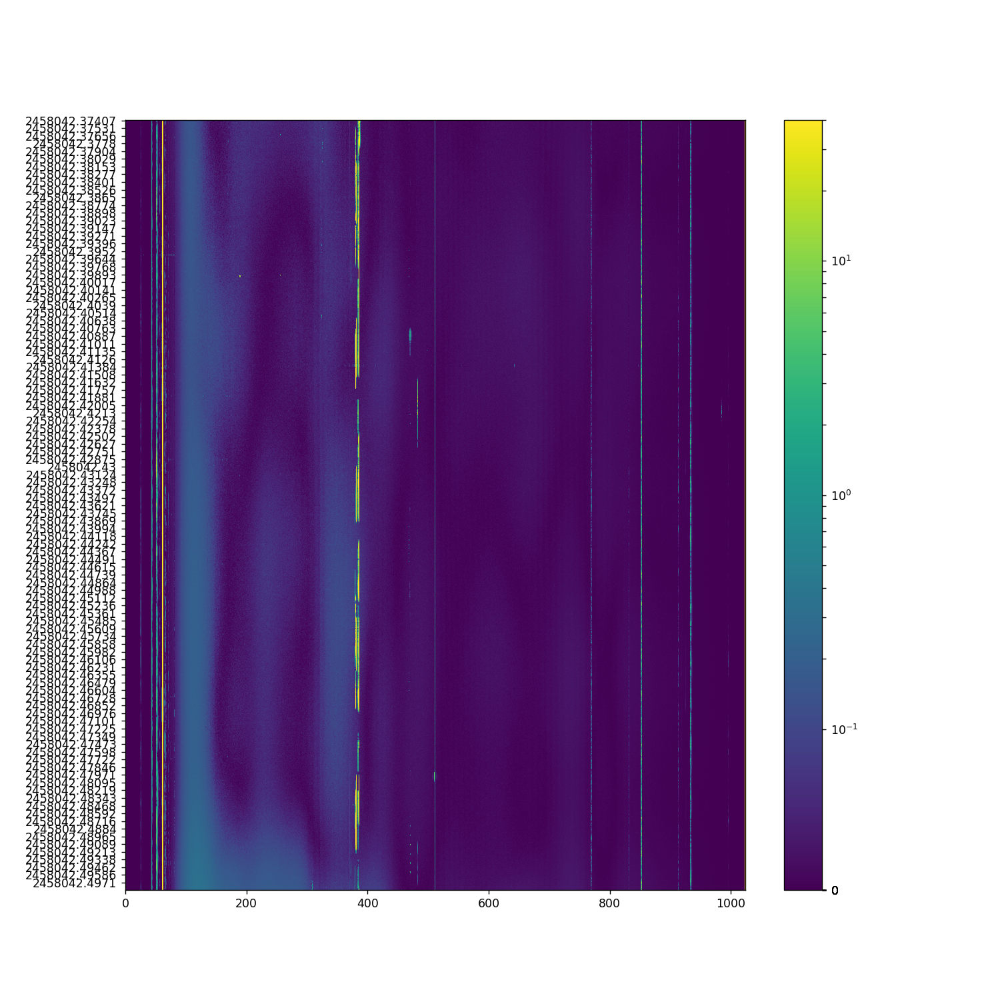

In [48]:
plt.figure(figsize=(12,12))
plt.imshow(np.abs(full_array3[2000:3000][:]),aspect='auto', norm=SymLogNorm(vmin=0,vmax=40,linthresh=.1))
plt.yticks(np.arange(0,1000,10),timearr3[2000:3000:10])
plt.colorbar()
plt.show()


In [53]:

first=True
full_array3=[]
#check the list
print(folders3)
print(len(folders3))

for folder in folders3:
    UV.read_miriad(folder, ant_pairs_nums=[(ant5,ant6)])
    print('Accessing ' + folder)
    temp_array3=UV.get_data((ant5,ant6,UV.polarization_array[0]))
    times=UV.get_times(ant5,ant6)
    UV.set_lsts_from_time_array()
    ind=UV.antpair2ind(ant5,ant6)
    temptime3=UV.lst_array[ind]
    if first==True:
        print('setting full for first time')
        full_array3=temp_array3
        timearr3=times
        first=False
    else:
        print('vstacking...')
        full_array3=np.vstack((full_array3, temp_array3))
        timearr3=np.hstack((timearr3,times))
    print(first)
    print('temp shape:')
    print(temp_array3.shape)
    print('Current shape:')
    print(full_array3.shape)
    print ('Time shape')
    print(timearr3.shape)

['../../data/2458042/zen.2458042.12552.xx.HH.uv', '../../data/2458042/zen.2458042.13298.xx.HH.uv', '../../data/2458042/zen.2458042.14043.xx.HH.uv', '../../data/2458042/zen.2458042.14789.xx.HH.uv', '../../data/2458042/zen.2458042.15535.xx.HH.uv', '../../data/2458042/zen.2458042.16280.xx.HH.uv', '../../data/2458042/zen.2458042.17026.xx.HH.uv', '../../data/2458042/zen.2458042.17772.xx.HH.uv', '../../data/2458042/zen.2458042.18517.xx.HH.uv', '../../data/2458042/zen.2458042.19263.xx.HH.uv', '../../data/2458042/zen.2458042.20009.xx.HH.uv', '../../data/2458042/zen.2458042.20754.xx.HH.uv', '../../data/2458042/zen.2458042.21500.xx.HH.uv', '../../data/2458042/zen.2458042.22245.xx.HH.uv', '../../data/2458042/zen.2458042.22991.xx.HH.uv', '../../data/2458042/zen.2458042.23737.xx.HH.uv', '../../data/2458042/zen.2458042.24482.xx.HH.uv', '../../data/2458042/zen.2458042.25228.xx.HH.uv', '../../data/2458042/zen.2458042.25974.xx.HH.uv', '../../data/2458042/zen.2458042.26719.xx.HH.uv', '../../data/2458042

<IPython.core.display.Javascript object>


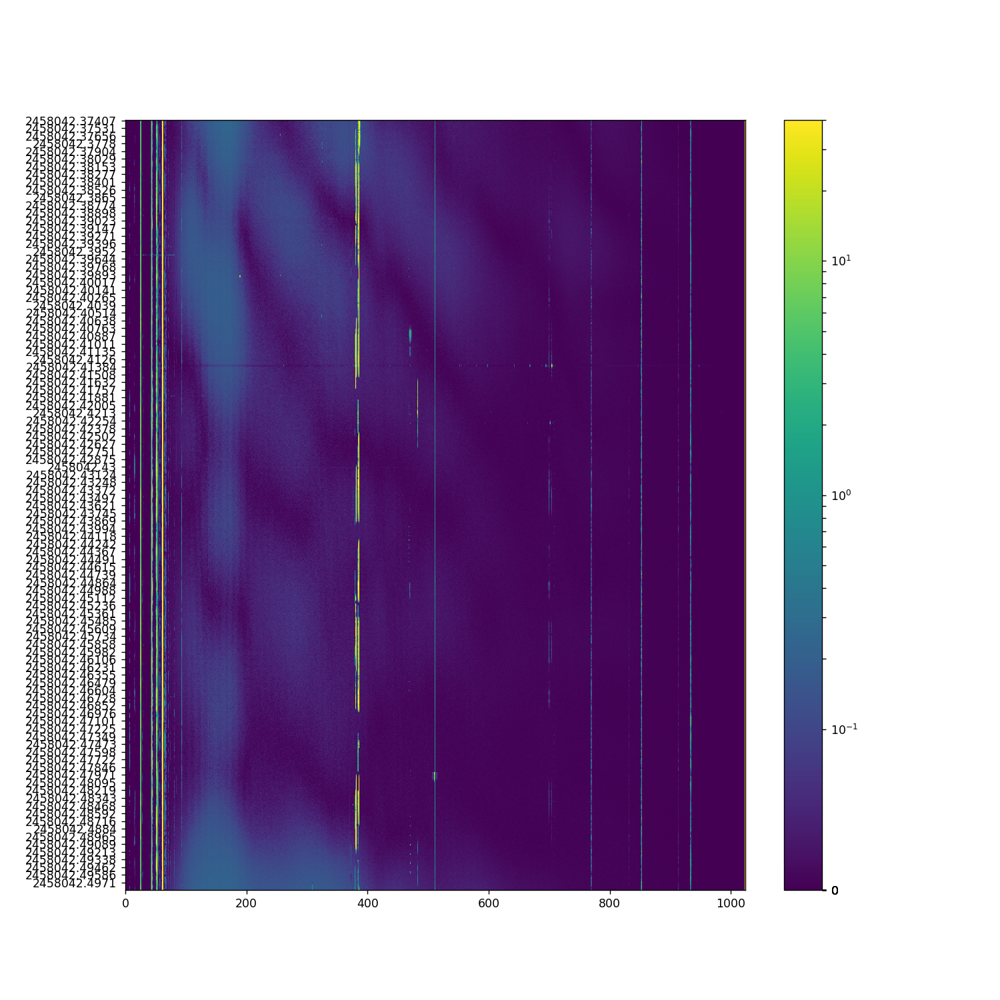

In [54]:
plt.figure(figsize=(12,12))
plt.imshow(np.abs(full_array3[2000:3000][:]),aspect='auto', norm=SymLogNorm(vmin=0,vmax=40,linthresh=.1))
plt.yticks(np.arange(0,1000,10),timearr3[2000:3000:10])
plt.colorbar()
plt.show()


In [55]:

first=True
full_array3=[]
#check the list
print(folders3)
print(len(folders3))

for folder in folders3:
    UV.read_miriad(folder, ant_pairs_nums=[(ant7,ant8)])
    print('Accessing ' + folder)
    temp_array3=UV.get_data((ant7,ant8,UV.polarization_array[0]))
    times=UV.get_times(ant7,ant8)
    UV.set_lsts_from_time_array()
    ind=UV.antpair2ind(ant7,ant8)
    temptime3=UV.lst_array[ind]
    if first==True:
        print('setting full for first time')
        full_array3=temp_array3
        timearr3=times
        first=False
    else:
        print('vstacking...')
        full_array3=np.vstack((full_array3, temp_array3))
        timearr3=np.hstack((timearr3,times))
    print(first)
    print('temp shape:')
    print(temp_array3.shape)
    print('Current shape:')
    print(full_array3.shape)
    print ('Time shape')
    print(timearr3.shape)

['../../data/2458042/zen.2458042.12552.xx.HH.uv', '../../data/2458042/zen.2458042.13298.xx.HH.uv', '../../data/2458042/zen.2458042.14043.xx.HH.uv', '../../data/2458042/zen.2458042.14789.xx.HH.uv', '../../data/2458042/zen.2458042.15535.xx.HH.uv', '../../data/2458042/zen.2458042.16280.xx.HH.uv', '../../data/2458042/zen.2458042.17026.xx.HH.uv', '../../data/2458042/zen.2458042.17772.xx.HH.uv', '../../data/2458042/zen.2458042.18517.xx.HH.uv', '../../data/2458042/zen.2458042.19263.xx.HH.uv', '../../data/2458042/zen.2458042.20009.xx.HH.uv', '../../data/2458042/zen.2458042.20754.xx.HH.uv', '../../data/2458042/zen.2458042.21500.xx.HH.uv', '../../data/2458042/zen.2458042.22245.xx.HH.uv', '../../data/2458042/zen.2458042.22991.xx.HH.uv', '../../data/2458042/zen.2458042.23737.xx.HH.uv', '../../data/2458042/zen.2458042.24482.xx.HH.uv', '../../data/2458042/zen.2458042.25228.xx.HH.uv', '../../data/2458042/zen.2458042.25974.xx.HH.uv', '../../data/2458042/zen.2458042.26719.xx.HH.uv', '../../data/2458042

vstacking...
False
temp shape:
(60, 1024)
Current shape:
(1980, 1024)
Time shape
(1980,)
Accessing ../../data/2458042/zen.2458042.37159.xx.HH.uv
vstacking...
False
temp shape:
(60, 1024)
Current shape:
(2040, 1024)
Time shape
(2040,)
Accessing ../../data/2458042/zen.2458042.37904.xx.HH.uv
vstacking...
False
temp shape:
(60, 1024)
Current shape:
(2100, 1024)
Time shape
(2100,)
Accessing ../../data/2458042/zen.2458042.38650.xx.HH.uv
vstacking...
False
temp shape:
(60, 1024)
Current shape:
(2160, 1024)
Time shape
(2160,)
Accessing ../../data/2458042/zen.2458042.39396.xx.HH.uv
vstacking...
False
temp shape:
(60, 1024)
Current shape:
(2220, 1024)
Time shape
(2220,)
Accessing ../../data/2458042/zen.2458042.40141.xx.HH.uv
vstacking...
False
temp shape:
(60, 1024)
Current shape:
(2280, 1024)
Time shape
(2280,)
Accessing ../../data/2458042/zen.2458042.40887.xx.HH.uv
vstacking...
False
temp shape:
(60, 1024)
Current shape:
(2340, 1024)
Time shape
(2340,)
Accessing ../../data/2458042/zen.2458042.

<IPython.core.display.Javascript object>


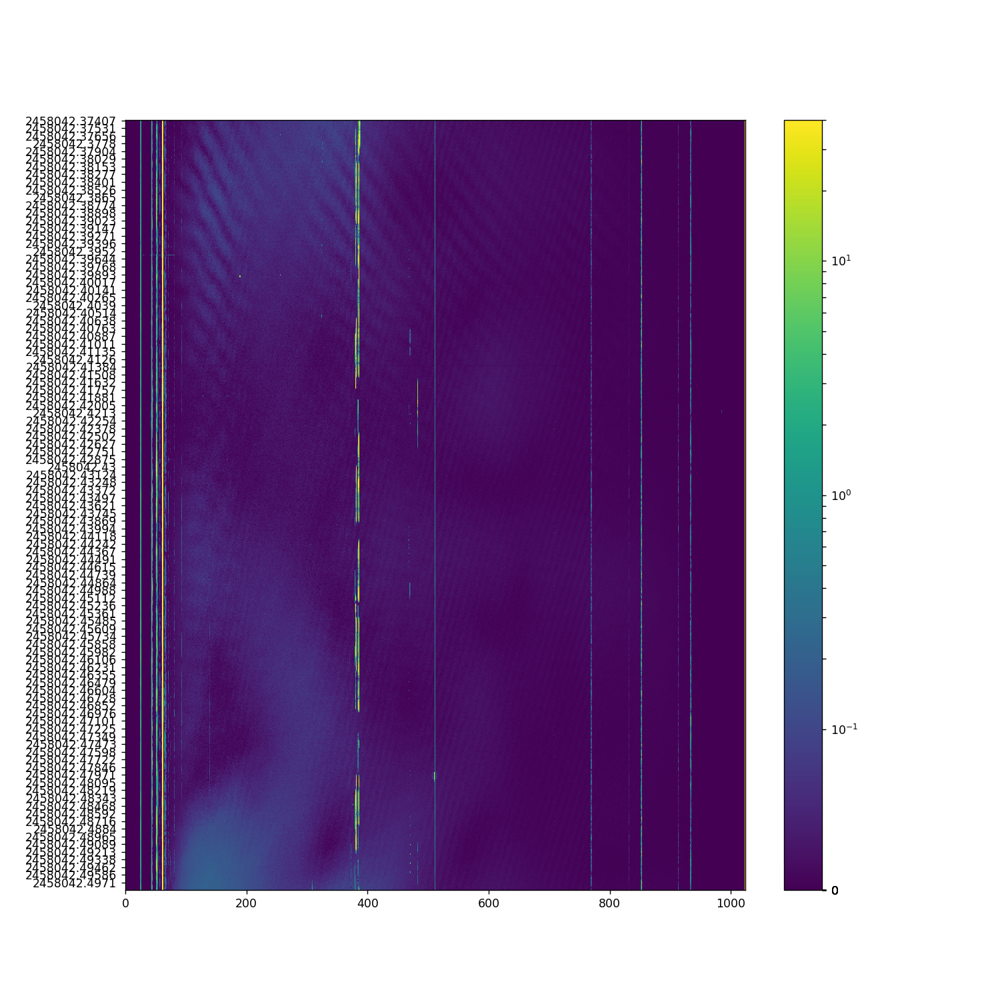

In [56]:
plt.figure(figsize=(12,12))
plt.imshow(np.abs(full_array3[2000:3000][:]),aspect='auto', norm=SymLogNorm(vmin=0,vmax=40,linthresh=.1))
plt.yticks(np.arange(0,1000,10),timearr3[2000:3000:10])
plt.colorbar()
plt.show()
